In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
from copairs import map

ModuleNotFoundError: No module named 'copairs'

In [3]:
import polars as pl

In [ ]:
import scanpy as sc
import polars as pl

## Introduction

Citation:
> Kalinin, A. A. et al. A versatile information retrieval framework for evaluating profile strength and similarity. bioRxiv, 2024-04, (2024).

In [ ]:
test = pl.read_parquet("/home/jovyan/share/data/analyses/benjamin/DINO/CELLDEATH/datasets_paper/paper_data/features/singlecell_features_CellProfiler.parquet")

In [3]:
# these imports are only needed for showing Figure 1 from the paper
import requests
from io import BytesIO
from pathlib import Path

from PIL import Image
from IPython.display import display

In [ ]:
df_sc_CP = pd.read_parquet("/home/jovyan/share/data/analyses/benjamin/DINO/CELLDEATH/datasets_paper/paper_data/features/singlecell_features_CellProfiler.parquet")


In [3]:
adata_CP_sc = sc.read_h5ad("/home/jovyan/share/data/analyses/benjamin/cellxgene/Beactica/cellprofiler/datasets/sc_profiles_sampled_beactica_CP.h5ad")

In [7]:
group_counts = pl.DataFrame(adata_CP_sc.obs).group_by('Metadata_cmpdNameConc').agg([
    pl.count().alias('count')
])
# Step 2: Filter groups where count is over 200
groups_below_200 = group_counts.filter(pl.col('count') < 200)['Metadata_cmpdNameConc']

/tmp/ipykernel_1883684/3166928173.py:2: DeprecationWarning: `pl.count()` is deprecated. Please use `pl.len()` instead.
  pl.count().alias('count')


In [4]:
adata_DP_sc = sc.read_h5ad("/home/jovyan/share/data/analyses/benjamin/cellxgene/Beactica/deepprofiler/sc_embedding_scanpy_Beactica_5%_SEGFIX.h5ad")


In [5]:
adata_DINO_sc = sc.read_h5ad("/home/jovyan/share/data/analyses/benjamin/DINO/CELLDEATH/datasets_paper/sc_embedding_DINO_full.h5ad")

In [8]:
def calculate_group_medians(adata, group_columns):
    # Ensure the columns exist in obs
    for col in group_columns:
        if col not in adata.obs:
            raise ValueError(f"Column {col} not found in obs.")
    
    # Group by the specified columns
    group_keys = adata.obs[group_columns].astype(str).agg("_".join, axis=1)
    adata.obs['group_key'] = group_keys
    
    # Calculate the median per group
    grouped = adata.to_df().groupby(adata.obs['group_key']).median()
    
    # Retrieve the unique combinations of group columns for obs
    unique_obs = adata.obs.drop_duplicates(subset='group_key')[['group_key'] + group_columns].set_index('group_key')
    unique_obs = unique_obs.loc[grouped.index]
    
    return grouped, unique_obs

group_columns = ['Metadata_Plate', 'Metadata_Site', "Metadata_Well", "moa", "Metadata_cmpdName", "Metadata_cmpdConc"]  # Replace with your column names

In [9]:
import pandas as pd
from scipy import sparse

def adata_to_dataframe(adata):
    """
    Converts an AnnData object's .obs and .X into a single pandas DataFrame.

    Rows = cells (adata.obs_names)
    Columns = .obs columns + expression columns (adata.var_names).

    Note:
    - This will convert a sparse matrix to a dense array, which can be memory-heavy 
      for large datasets.
    - Make sure .X contains the data you want. For raw counts, check if you need 
      adata.layers["counts"] or something similar.
    """
    # Copy obs metadata
    df_obs = adata.obs.copy()

    # Convert expression data to dense if it's sparse
    if sparse.issparse(adata.X):
        expr_array = adata.X.toarray()
    else:
        expr_array = adata.X

    # Create a DataFrame from the expression matrix
    df_expr = pd.DataFrame(
        data=expr_array,
        index=adata.obs_names,
        columns=adata.var_names
    )

    # Concatenate metadata + expression side by side
    df_combined = pd.concat([df_obs, df_expr], axis=1)

    return df_combined


In [10]:
median_data, new_obs = calculate_group_medians(adata_CP_sc, group_columns)

adata_CP_agg = sc.AnnData(X=median_data.values, obs=new_obs)
adata_CP_agg.var_names = adata_CP_agg.var_names

In [11]:
median_data, new_obs = calculate_group_medians(adata_DP_sc, group_columns)

adata_DP_agg = sc.AnnData(X=median_data.values, obs=new_obs)
adata_DP_agg.var_names = adata_DP_agg.var_names

In [12]:
median_data, new_obs = calculate_group_medians(adata_DINO_sc, group_columns)

adata_DINO_agg = sc.AnnData(X=median_data.values, obs=new_obs)
adata_DINO_agg.var_names = adata_DINO_agg.var_names

In [16]:
df_CP = adata_to_dataframe(adata_CP_agg)
df_CP["CompConc"] = df_CP["Metadata_cmpdName"].astype("str") + "_" + df_CP["Metadata_cmpdConc"].astype("str")
df_DP = adata_to_dataframe(adata_DP_agg)
df_DP["CompConc"] = df_DP["Metadata_cmpdName"].astype("str") + "_" + df_DP["Metadata_cmpdConc"].astype("str")
df_DINO = adata_to_dataframe(adata_DINO_agg)
df_DINO["CompConc"] = df_DINO["Metadata_cmpdName"].astype("str") + "_" + df_DINO["Metadata_cmpdConc"].astype("str")


df_CP_sc = adata_to_dataframe(adata_CP_sc)
df_CP_sc["CompConc"] = df_CP_sc["Metadata_cmpdName"].astype("str") + "_" + df_CP_sc["Metadata_cmpdConc"].astype("str")
df_DP_sc = adata_to_dataframe(adata_DP_sc)
df_DP_sc["CompConc"] = df_DP_sc["Metadata_cmpdName"].astype("str") + "_" + df_DP_sc["Metadata_cmpdConc"].astype("str")
df_DINO_sc = adata_to_dataframe(adata_DINO_sc)
df_DINO_sc["CompConc"] = df_DINO_sc["Metadata_cmpdName"].astype("str") + "_" + df_DINO_sc["Metadata_cmpdConc"].astype("str")


In [191]:
print(len(df_DINO.CompConc.unique()))
df_DINO.CompConc.value_counts()

322


CompConc
DIMETHYL SULFOXIDE_0.1    904
NIGERICIN_1.0             144
ETOPOSIDE_3.0             138
NIGERICIN_0.1             138
POLYPHYLLIN VI_0.1        137
                         ... 
G5_5.0                      1
NARCICLASINE_3.0            1
SHIKONIN_10.0               1
BORTEZOMIB_5.0              1
BORTEZOMIB_10.0             1
Name: count, Length: 322, dtype: int64

In [35]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_obs_count_bargrid(
    adata,
    compound_col="Metadata_cmpdName",
    conc_col="Metadata_cmpdConc",
    class_col="moa",
    expected_concs=[0.1, 0.3, 1.0, 3.0, 5.0, 10.0],
    figsize=(14, 12),
    color_map=None,
    ymax=None
):
    """
    Barplot grid showing counts per compound, split by concentration,
    with color-coded bars based on a class column (e.g., 'moa').
    """
    df = adata.obs.copy()

    # Round concentration values to nearest expected level
    df[conc_col] = df[conc_col].astype(float).apply(lambda x: min(expected_concs, key=lambda y: abs(y - x)))
    df[conc_col] = pd.Categorical(df[conc_col], categories=sorted(expected_concs), ordered=True)

    # Count per compound + concentration and get class
    count_df = df.groupby([compound_col, conc_col, class_col]).size().reset_index(name='count')

    # Ensure compound order is consistent
    compound_order = sorted(count_df[compound_col].unique())

    # Custom plotting function
    def colored_barplot(data, x, y, ax=None, order=None, **kwargs):
        if ax is None:
            ax = plt.gca()

        for i, row in data.iterrows():
            xpos = order.index(row[compound_col])
            color = color_map.get(row[class_col], "gray")
            ax.bar(x=xpos, height=row[y], color=color, width=0.8)

            # Annotate if height > ymax
            if ymax is not None and row[y] > ymax:
                ax.annotate(f"{int(row[y])}",
                            xy=(xpos, ymax),
                            xytext=(0, 3),
                            textcoords='offset points',
                            ha='center', va='bottom',
                            fontsize=10, fontweight='bold')

        # Fix x-axis ticks
        ax.set_xticks(range(len(order)))
        ax.set_xticklabels(order, rotation=90 if kwargs.get("rotate_xticks", False) else 0)

        if ymax is not None:
            ax.set_ylim(0, ymax)

    # Create FacetGrid
    g = sns.FacetGrid(
        data=count_df,
        row=conc_col,
        row_order=sorted(expected_concs),
        height=2.5,
        aspect=figsize[0] / figsize[1],
        sharex=True,
        sharey=False
    )

    # Map colored barplot
    g.map_dataframe(
        colored_barplot,
        x=compound_col,
        y="count",
        order=compound_order,
        rotate_xticks=True
    )

    # Set labels and titles
    g.set_axis_labels("Compound", "Cell Count")
    g.set_titles(row_template="{row_name} µM", fontweight='bold')

    plt.tight_layout()
    plt.show()


In [26]:
color_map = {
    'autophagy inducer': (0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
    'apoptosis': (1.0, 0.4980392156862745, 0.054901960784313725),
    'ferroptosis inducer': (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
    'immunogenic cell death': (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
    'pyroptosis inducer': (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
    'necroptosis inducer': (0.5490196078431373, 0.33725490196078434, 0.29411764705882354)
}

/tmp/ipykernel_942272/1178970845.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count_df = df.groupby([compound_col, conc_col, class_col]).size().reset_index(name='count')


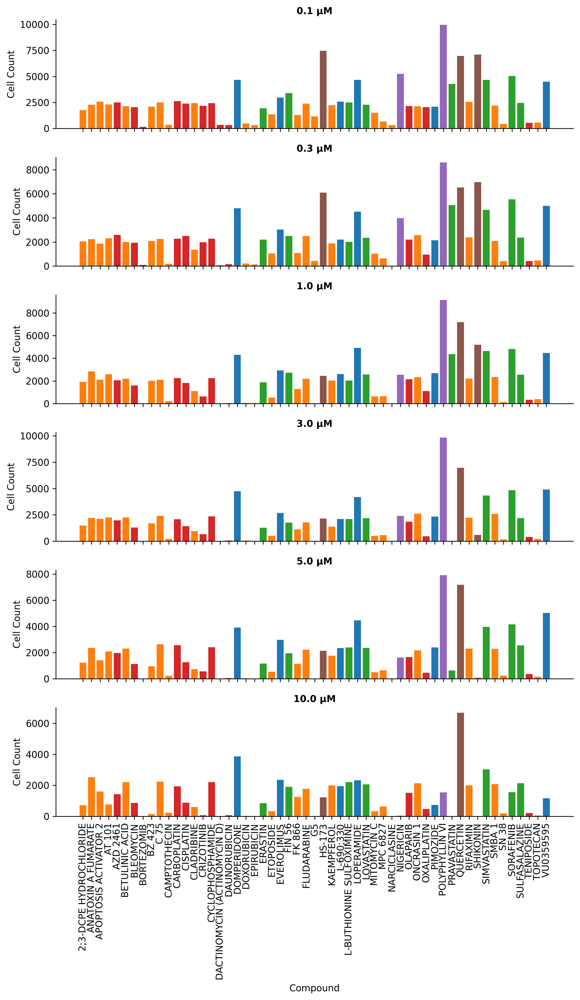

In [36]:
plot_obs_count_bargrid(
    adata= adata_CP_sc[
    (adata_CP_sc.obs["Metadata_cmpdName"] != "DIMETHYL SULFOXIDE") &
    (adata_CP_sc.obs["moa"].isin([
        "ferroptosis inducer",
        "autophagy inducer",
        "pyroptosis inducer",
        "apoptosis",
        "necroptosis inducer",
        "immunogenic cell death"
    ]))
],
    compound_col="Metadata_cmpdName",
    conc_col="Metadata_cmpdConc",  # e.g. concentration
    figsize=(35, 10),
    color_map = color_map
)

/tmp/ipykernel_942272/4093839272.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count_df = df.groupby([compound_col, conc_col, class_col]).size().reset_index(name='count')


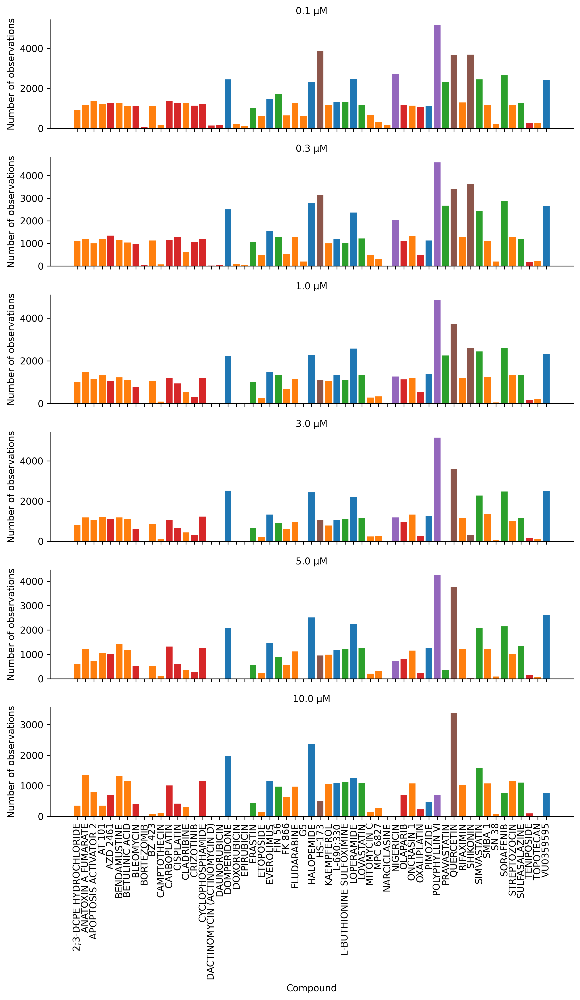

In [31]:
plot_obs_count_bargrid(
    adata=adata_DP_sc[
    (adata_DP_sc.obs["Metadata_cmpdName"] != "DIMETHYL SULFOXIDE") &
    (adata_DP_sc.obs["moa"].isin([
        "ferroptosis inducer",
        "autophagy inducer",
        "pyroptosis inducer",
        "apoptosis",
        "necroptosis inducer",
        "immunogenic cell death"
    ]) & (adata_DP_sc.obs["Metadata_cmpdName"] != "DOCOSAHEXAENOIC ACID"))
],
    compound_col="Metadata_cmpdName",
    conc_col="Metadata_cmpdConc",  # e.g. concentration
    figsize=(35, 10),
    color_map = color_map)

/tmp/ipykernel_942272/4093839272.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count_df = df.groupby([compound_col, conc_col, class_col]).size().reset_index(name='count')


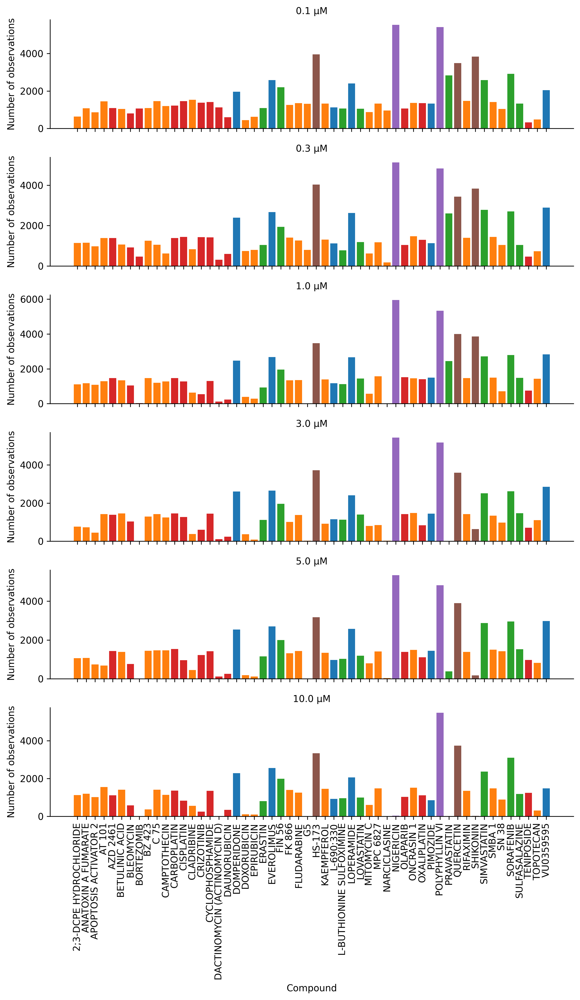

In [33]:
plot_obs_count_bargrid(
    adata = adata_DINO_sc[
    (adata_DINO_sc.obs["Metadata_cmpdName"] != "DIMETHYL SULFOXIDE") &
    (adata_DINO_sc.obs["moa"].isin([
        "ferroptosis inducer",
        "autophagy inducer",
        "pyroptosis inducer",
        "apoptosis",
        "necroptosis inducer",
        "immunogenic cell death"
    ])& (adata_DINO_sc.obs["Metadata_cmpdName"] != "DOCOSAHEXAENOIC ACID"))
],
    compound_col="Metadata_cmpdName",
    conc_col="Metadata_cmpdConc",  # e.g. concentration
    figsize=(35, 10),
    color_map = color_map
)

In [64]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_groupcount_boxplot(adata, group_col, conc_col="Metadata_cmpdConc", moa_col="moa", expected_concs=[0.1, 0.3, 1.0, 3.0, 5.0, 10.0],
                            color_map=None, figsize=(12, 6)):
    """
    Create boxplots of cell counts per group, split by concentration, colored by MoA.
    
    Parameters:
    - adata: AnnData object
    - group_col: list of columns to group by (e.g., ["Metadata_cmpdName", "Metadata_cmpdConc"])
    - conc_col: str, column name of concentration
    - moa_col: str, column name of MoA class
    - color_map: dict, mapping MoA to RGB tuples
    - figsize: figure size
    """
    if color_map is None:
        raise ValueError("Please provide a color_map for MoA classes.")

    df = adata.obs.copy()

    df[conc_col] = df[conc_col].astype(float).apply(
        lambda x: min(expected_concs, key=lambda y: abs(y - x))
    )
    df[conc_col] = pd.Categorical(df[conc_col], categories=sorted(expected_concs), ordered=True)
    # Ensure float concentrations
    df[conc_col] = df[conc_col].astype(float)

    # If group_col is a single string, convert to list
    if isinstance(group_col, str):
        group_col = [group_col]

    # Group and count
    grouped = df.groupby(group_col)
    count_df = grouped.size().reset_index(name='count')
    count_df[conc_col] = grouped[conc_col].first().values
    count_df[moa_col] = grouped[moa_col].first().values

    # Plot
    plt.figure(figsize=figsize)
    ax = sns.boxplot(
        data=count_df,
        x=conc_col,
        y="count",
        hue=moa_col,
        palette=color_map,
        linewidth=1
    )

    ax.set_xlabel("Concentration [µM]", fontsize=12, fontweight='bold')
    ax.set_ylabel("Cell Count", fontsize=12, fontweight='bold')
    ax.set_title("Cell Count per Concentration Group (Boxplot)", fontsize=14, fontweight='bold')
    ax.legend(title="MoA", bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.grid(True)
    plt.tight_layout()
    plt.show()


/tmp/ipykernel_942272/474155826.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(group_col)


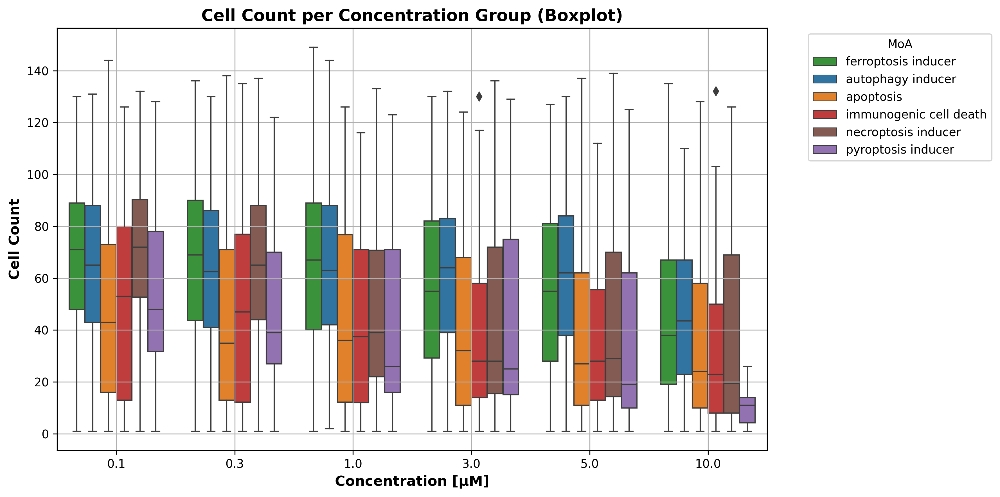

In [67]:
plot_groupcount_boxplot(
    adata=adata_CP_sc[
    (adata_CP_sc.obs["Metadata_cmpdName"] != "DIMETHYL SULFOXIDE") &
    (adata_CP_sc.obs["moa"].isin([
        "ferroptosis inducer",
        "autophagy inducer",
        "pyroptosis inducer",
        "apoptosis",
        "necroptosis inducer",
        "immunogenic cell death"
    ])& (adata_CP_sc.obs["Metadata_cmpdName"] != "DOCOSAHEXAENOIC ACID"))
],
    group_col=["Metadata_cmpdName", "Metadata_cmpdConc", "Metadata_Plate", "Metadata_Site", "Metadata_Well"],
    conc_col="Metadata_cmpdConc",
    moa_col="moa",
    color_map=color_map
)


/tmp/ipykernel_942272/474155826.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(group_col)


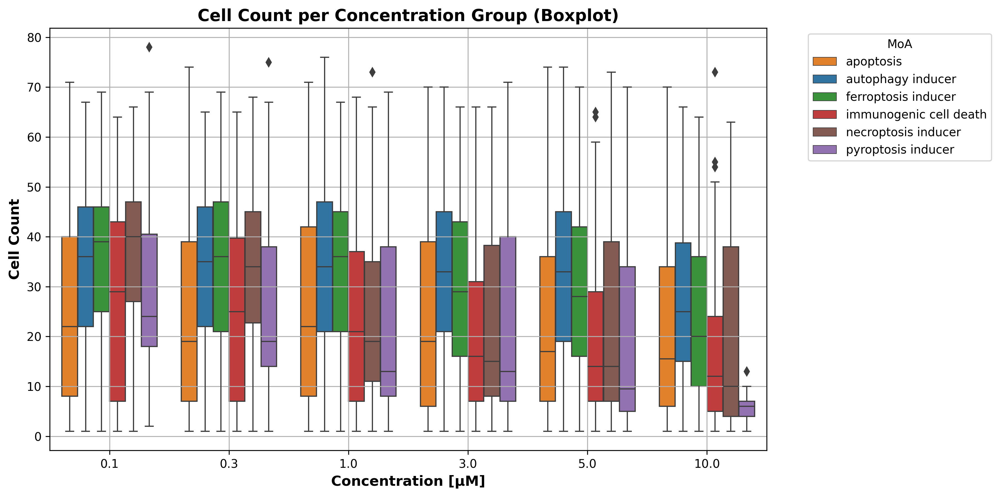

In [68]:
plot_groupcount_boxplot(
    adata=adata_DP_sc[
    (adata_DP_sc.obs["Metadata_cmpdName"] != "DIMETHYL SULFOXIDE") &
    (adata_DP_sc.obs["moa"].isin([
        "ferroptosis inducer",
        "autophagy inducer",
        "pyroptosis inducer",
        "apoptosis",
        "necroptosis inducer",
        "immunogenic cell death"
    ])& (adata_DP_sc.obs["Metadata_cmpdName"] != "DOCOSAHEXAENOIC ACID"))
],
    group_col=["Metadata_cmpdName", "Metadata_cmpdConc", "Metadata_Site", "Metadata_Plate", "Metadata_Well"],
    conc_col="Metadata_cmpdConc",
    moa_col="moa",
    color_map=color_map
)


/tmp/ipykernel_942272/474155826.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(group_col)


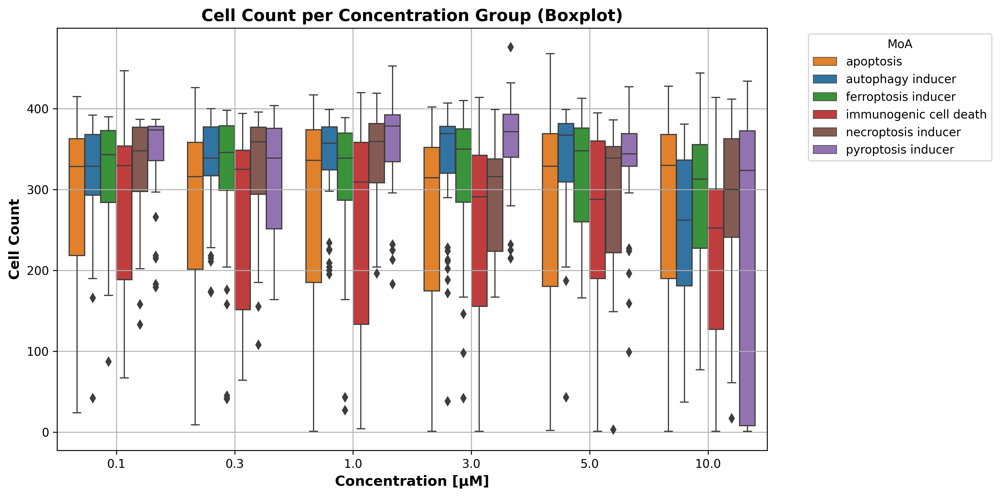

In [70]:
plot_groupcount_boxplot(
    adata=adata_DINO_sc[
    (adata_DINO_sc.obs["Metadata_cmpdName"] != "DIMETHYL SULFOXIDE") &
    (adata_DINO_sc.obs["moa"].isin([
        "ferroptosis inducer",
        "autophagy inducer",
        "pyroptosis inducer",
        "apoptosis",
        "necroptosis inducer",
        "immunogenic cell death"
    ])& (adata_DINO_sc.obs["Metadata_cmpdName"] != "DOCOSAHEXAENOIC ACID"))
],
    group_col=["Metadata_cmpdName", "Metadata_cmpdConc", "Metadata_Plate", "Metadata_Well"],
    conc_col="Metadata_cmpdConc",
    moa_col="moa",
    color_map=color_map
)


Note that in this dataset, pertubations can target multiple genes. We can list these targets from the `Metadata_target` column.

## Assessing phenotypic activity of compounds with mAP

Phenotypic activity of a perturbation reflects the average extent to which its replicate profiles are more similar to each other compared to control profiles (Figure 1E).

Here, we treat different doses of each compound as replicates and assess how well we can retrieve them by similarity against the group of negative controls (DMSO).

To ensure correct grouping of profiles, we can add a dummy column that is equal to row index for all compound replicates and to -1 for all DMSO replicates. 

In [10]:
# make deafult value equal to row index
df_DINO["Metadata_treatment_index"] = df_DINO.index
# make index equal to -1 for all DMSO treatment replicates
df_DINO.loc[df_DINO["Metadata_cmpdName"] == "DIMETHYL SULFOXIDE", "Metadata_treatment_index"] = -1
# now all treatment replicates differ in the index column, except for DMSO replicates
df_DINO.insert(
    0, "Metadata_treatment_index", df_DINO.pop("Metadata_treatment_index")
)
df_DINO

,Metadata_treatment_index,Metadata_Plate,Metadata_Site,Metadata_Well,moa,Metadata_cmpdName,Metadata_cmpdConc,0,1,2,...,375,376,377,378,379,380,381,382,383,CompConc
group_key,,,,,,,,,,,,,,,,,,,,,
PB000046_s1_B02_autophagy inducer_DOMPERIDONE_3.0,PB000046_s1_B02_autophagy inducer_DOMPERIDONE_3.0,PB000046,s1,B02,autophagy inducer,DOMPERIDONE,3.00,0.861630,-0.137150,0.029455,...,0.582989,0.724093,-0.862044,0.291567,0.920972,-0.682962,0.520569,0.967750,-0.479686,DOMPERIDONE_3.0
PB000046_s1_B03_apoptosis_ANATOXIN A FUMARATE_3.0,PB000046_s1_B03_apoptosis_ANATOXIN A FUMARATE_3.0,PB000046,s1,B03,apoptosis,ANATOXIN A FUMARATE,3.00,0.832779,0.628181,0.478648,...,0.039617,0.993514,-0.189853,0.968556,0.425984,-0.624004,0.386128,0.480482,-0.368560,ANATOXIN A FUMARATE_3.0
PB000046_s1_B04_immunogenic cell death_BLEOMYCIN_3.0,PB000046_s1_B04_immunogenic cell death_BLEOMYC...,PB000046,s1,B04,immunogenic cell death,BLEOMYCIN,3.00,0.924418,-0.058898,0.544293,...,0.544304,0.791618,-0.789368,0.698520,0.580293,-0.398587,-0.117720,1.062003,-0.152924,BLEOMYCIN_3.0
PB000046_s1_B05_ferroptosis inducer_L-BUTHIONINE SULFOXIMINE_3.0,PB000046_s1_B05_ferroptosis inducer_L-BUTHIONI...,PB000046,s1,B05,ferroptosis inducer,L-BUTHIONINE SULFOXIMINE,3.00,0.135567,0.368854,0.127929,...,0.052949,0.668619,-0.373329,-0.121073,-0.333411,-0.330049,-0.319535,-0.003933,-0.897774,L-BUTHIONINE SULFOXIMINE_3.0
PB000046_s1_B07_immunogenic cell death_DAUNORUBICIN_10.0,PB000046_s1_B07_immunogenic cell death_DAUNORU...,PB000046,s1,B07,immunogenic cell death,DAUNORUBICIN,10.00,0.259634,0.840883,0.759766,...,0.151263,0.150422,-0.761110,-1.031659,0.442501,0.232867,0.829442,-0.633506,0.510493,DAUNORUBICIN_10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PB000053_s9_O18_apoptosis_ONCRASIN 1_0.1,PB000053_s9_O18_apoptosis_ONCRASIN 1_0.1,PB000053,s9,O18,apoptosis,ONCRASIN 1,0.10,0.219159,0.336323,0.521167,...,0.103077,0.198983,-0.921878,0.298851,0.506768,0.173841,-0.320539,1.089391,0.528275,ONCRASIN 1_0.1
PB000053_s9_O19_ferroptosis inducer_SIMVASTATIN_0.3,PB000053_s9_O19_ferroptosis inducer_SIMVASTATI...,PB000053,s9,O19,ferroptosis inducer,SIMVASTATIN,0.30,0.502169,0.515296,0.619706,...,-0.405413,0.423607,-1.007990,0.181716,0.710182,-0.535485,-0.153665,0.810987,-0.054679,SIMVASTATIN_0.3
PB000053_s9_O20_apoptosis_RIFAXIMIN_3.0,PB000053_s9_O20_apoptosis_RIFAXIMIN_3.0,PB000053,s9,O20,apoptosis,RIFAXIMIN,3.00,0.232869,0.519128,0.675548,...,0.000695,0.192081,-0.980835,0.434352,0.076479,-0.106383,-0.328088,1.055886,0.208027,RIFAXIMIN_3.0


In [193]:
import numpy as np
import pandas as pd
from scipy.special import comb
m = (
    df_DINO.query("CompConc != 'DIMETHYL SULFOXIDE_0.1'")
    .groupby("CompConc")
    .size()
    .mode()[0]
)
# the number of control profiles is 24
n = 0.01*df_DINO.query("CompConc == 'DIMETHYL SULFOXIDE_0.1'").shape[0]

d = comb(m - 1 + n, m - 1, exact=True)


print(f"{m=}, {n=}, {d=}")


m=np.int64(34), n=9.040000000000001, d=np.float64(473391209.25852674)


/tmp/ipykernel_1857687/1942121353.py:13: DeprecationWarning: `exact=True` is deprecated for non-integer `N` and `k` and will raise an error in SciPy 1.16.0
  d = comb(m - 1 + n, m - 1, exact=True)


Next, we define the rules by which profiles are grouped based on metadata:

* Two profiles are a positive pair if they belong to the same group that is not a control group. In this case, any two replicate profiles of the same compound are a positive pair. To define that using metadata columns, positive pairs should share the same value in the metadata column that identifies compounds (`Metadata_broad_sample`). We add this column to a list names `pos_sameby`.

* In this case, profiles that form a positive pair do not need to be different in any of the metatada columns, so we keep `pos_diffby` empty. Although one could define them as being from different batches, for instance, to account for batch effects.

* Two profiles are a negative pair when one of them belongs to a group of compound replicates and another to a group of DMSO controls. That means they should be different both in the metadata column that identifies the specific compound and the treatment index columns that we created. The latter is needed to ensure that replicates of compounds are retrieved against only DMSO controls at this stage (and not against replicates of other compounds). We list these columns in `neg_diffby`.

* Profiles that form a negative pair do not need to be same in any of the metatada columns, so we keep `neg_sameby` empty.

In [11]:
# positive pairs are replicates of the same treatment
pos_sameby = ["CompConc"]
pos_diffby = []

neg_sameby = []
# negative pairs are replicates of different treatments
neg_diffby = ["CompConc", "Metadata_treatment_index"]

Now we can use `average_precision` function to calculate the average precision score for each replicate of each compound.

It returns metadata with 3 new columns: number of positive and negative pairs for each replicate profile and the average precision score.

In [22]:
#metadata = df_activity.filter(regex="^Metadata")
#profiles = df_activity.filter(regex="^(?!Metadata)").values

#replicate_aps = map.average_precision(
#    metadata, profiles, pos_sameby, pos_diffby, neg_sameby, neg_diffby
#)
#replicate_aps = replicate_aps.query("Metadata_broad_sample != 'DMSO'")  # remove DMSO
#replicate_aps

In [12]:
meta_cols = [
    col
    for col in df_DINO.columns
    if ("Metadata" in col) or (col in ("moa", "CompConc"))
]

In [1]:
import pandas as pd
import tqdm

def run_map_calc(df, meta_cols):
# Assuming df_gene is your input DataFrame
    df = df.dropna()
    metadata = df[meta_cols]
    profiles = df[[str(col) for col in df.columns if col not in meta_cols]]

    # Subset DMSO to 54 occurrences
    dmso_count = int(0.05 * len(metadata[metadata['Metadata_cmpdName'] == 'DIMETHYL SULFOXIDE']))
    dmso_subset = metadata[metadata['Metadata_cmpdName'] == 'DIMETHYL SULFOXIDE'].sample(n=dmso_count, random_state=42)
    dmso_profiles_subset = profiles.loc[dmso_subset.index]

    # List to store results for each iteration
    results = []

    # Unique CompConc excluding 'DMSO' batch
    unique_compconc = metadata[metadata['Metadata_cmpdName'] != 'DIMETHYL SULFOXIDE']['CompConc'].unique()

    # Split metadata into batches, processing 1 unique CompConc at a time
    for i in range(0, len(unique_compconc), 10):
        # Select a batch of 1 unique CompConc
        batch_compconc = unique_compconc[i:i+10]

        # Filter metadata and profiles based on the selected CompConc and subset DMSO
        batch_metadata = pd.concat([
            metadata[metadata['CompConc'].isin(batch_compconc)],
            dmso_subset
        ])
        batch_profiles = pd.concat([
            profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],
            dmso_profiles_subset
        ])

        batch_metadata = batch_metadata.reset_index(drop=True)
        batch_profiles = batch_profiles.reset_index(drop=True)

        # Set Metadata_treatment_index: -1 for DMSO replicates
        batch_metadata["Metadata_treatment_index"] = batch_metadata.index
        batch_metadata.loc[batch_metadata["Metadata_cmpdName"] == "DIMETHYL SULFOXIDE", "Metadata_treatment_index"] = -1
        batch_metadata.insert(
            0, "Metadata_treatment_index", batch_metadata.pop("Metadata_treatment_index")
        )

        # Display (optional, for debugging)


        # Calculate replicate_aps for each batch
        replicate_aps_batch = map.average_precision(
            batch_metadata, batch_profiles.values, pos_sameby, pos_diffby, neg_sameby, neg_diffby
        )

        # Filter out DMSO results and store batch replicate_aps
        replicate_aps_batch = replicate_aps_batch.query("Metadata_cmpdName != 'DIMETHYL SULFOXIDE'")
        results.append(replicate_aps_batch)

    # Concatenate all results into a final DataFrame
    final_replicate_aps = pd.concat(results, ignore_index=True)
    final_replicate_aps


    return final_replicate_aps

In [15]:
final_replicate_aps_DINO = run_map_calc(df_DINO, meta_cols)

  0%|          | 0/33 [00:00<?, ?it/s]

/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  3%|▎         | 1/33 [00:00<00:31,  1.00it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  6%|▌         | 2/33 [00:01<00:27,  1.15it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  9%|▉         | 3/33 [00:02<00:20,  1.44it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

 12%|█▏        | 4/33 [00:03<00:21,  1.35it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

 15%|█▌        | 5/33 [00:04<00:24,  1.12it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

 18%|█▊        | 6/33 [00:05<00:23,  1.15it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

 21%|██        | 7/33 [00:06<00:23,  1.10it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

 24%|██▍       | 8/33 [00:06<00:19,  1.28it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

 27%|██▋       | 9/33 [00:06<00:15,  1.53it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

 30%|███       | 10/33 [00:07<00:16,  1.41it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

 33%|███▎      | 11/33 [00:08<00:15,  1.43it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

 36%|███▋      | 12/33 [00:08<00:13,  1.61it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

 39%|███▉      | 13/33 [00:09<00:11,  1.73it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

 42%|████▏     | 14/33 [00:10<00:11,  1.63it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

 45%|████▌     | 15/33 [00:10<00:10,  1.78it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

 48%|████▊     | 16/33 [00:10<00:08,  1.92it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

 52%|█████▏    | 17/33 [00:11<00:07,  2.05it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

 55%|█████▍    | 18/33 [00:11<00:07,  2.14it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

 58%|█████▊    | 19/33 [00:12<00:06,  2.26it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

 61%|██████    | 20/33 [00:12<00:05,  2.29it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

 64%|██████▎   | 21/33 [00:12<00:05,  2.31it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

 67%|██████▋   | 22/33 [00:13<00:04,  2.38it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

 70%|██████▉   | 23/33 [00:13<00:04,  2.33it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

 73%|███████▎  | 24/33 [00:14<00:04,  2.22it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

 76%|███████▌  | 25/33 [00:14<00:03,  2.36it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

 79%|███████▉  | 26/33 [00:15<00:03,  2.33it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

 82%|████████▏ | 27/33 [00:15<00:02,  2.45it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

 85%|████████▍ | 28/33 [00:15<00:01,  2.56it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

 88%|████████▊ | 29/33 [00:16<00:01,  2.56it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

 91%|█████████ | 30/33 [00:16<00:01,  2.60it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

 94%|█████████▍| 31/33 [00:17<00:00,  2.55it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

 97%|█████████▋| 32/33 [00:17<00:00,  2.64it/s]/tmp/ipykernel_21597/3692426288.py:32: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  profiles.loc[batch_metadata[metadata['CompConc'].isin(batch_compconc)].index],


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 33/33 [00:17<00:00,  1.89it/s]


In [49]:
"""Functions to compute mean average precision."""

import logging
from pathlib import Path
from typing import Optional, Union, List

import numpy as np
import pandas as pd
from statsmodels.stats.multitest import multipletests
from tqdm.contrib.concurrent import thread_map

from copairs import compute

logger = logging.getLogger("copairs")


def mean_average_precision_custom(
    ap_scores: pd.DataFrame,
    sameby: List[str],
    null_size: int,
    threshold: float,
    seed: int,
    max_workers: Optional[int] = None,
    cache_dir: Optional[Union[str, Path]] = None,
) -> pd.DataFrame:
    """Calculate the Mean Average Precision (mAP) score and associated p-values.

    This function computes the Mean Average Precision (mAP) score by grouping profiles
    based on the specified criteria (`sameby`). It calculates the significance of mAP
    scores by comparing them to a null distribution and performs multiple testing
    corrections.

    Parameters
    ----------
    ap_scores : pd.DataFrame
        DataFrame containing individual Average Precision (AP) scores and pair statistics
        (e.g., number of positive pairs `n_pos_pairs` and total pairs `n_total_pairs`).
    sameby : list or str
        Metadata column(s) used to group profiles for mAP calculation.
    null_size : int
        Number of samples in the null distribution for significance testing.
    threshold : float
        p-value threshold for identifying significant MaP scores.
    seed : int
        Random seed for reproducibility.
    max_workers : int
        Number of workers used. Default defined by tqdm's `thread_map`

    Returns
    -------
    pd.DataFrame
        DataFrame with the following columns:
        - `mean_average_precision`: Mean AP score for each group.
        - `p_value`: p-value comparing mAP to the null distribution.
        - `corrected_p_value`: Adjusted p-value after multiple testing correction.
        - `below_p`: Boolean indicating if the p-value is below the threshold.
        - `below_corrected_p`: Boolean indicating if the corrected p-value is below the threshold.
    """
    # Filter out invalid or incomplete AP scores
    ap_scores = ap_scores.query("~average_precision.isna() and n_pos_pairs > 0")
    ap_scores = ap_scores.reset_index(drop=True).copy()

    logger.info("Computing null_dist...")
    # Extract configurations for null distribution generation
    null_confs = ap_scores[["n_pos_pairs", "n_total_pairs"]].values
    null_confs, rev_ix = np.unique(null_confs, axis=0, return_inverse=True)

    # Generate null distributions for each unique configuration
    null_dists = compute.get_null_dists(
        null_confs, null_size, seed=seed, cache_dir=cache_dir
    )
    ap_scores["null_ix"] = rev_ix

    # Function to calculate the p-value for a mAP score based on the null distribution
    def get_p_value(params):
        map_score, indices = params
        null_dist = null_dists[rev_ix[indices]].mean(axis=0)
        num = (null_dist > map_score).sum()
        p_value = (num + 1) / (null_size + 1)  # Add 1 for stability
        return p_value

    logger.info("Computing p-values...")

    # Group by the specified metadata column(s) and calculate mean AP
    map_scores = ap_scores.groupby(sameby, observed=True, as_index=False).agg(
        {
            "average_precision": ["mean", lambda x: list(x.index)],
        }
    )
    map_scores.columns = sameby + ["mean_average_precision", "indices"]

    # Compute p-values for each group using the null distributions
    params = map_scores[["mean_average_precision", "indices"]]

    map_scores["p_value"] = thread_map(
        get_p_value, params.values, leave=False, max_workers=max_workers
    )

    # Perform multiple testing correction on p-values
    reject, pvals_corrected, alphacSidak, alphacBonf = multipletests(
        map_scores["p_value"], method="holm-sidak"
    )
    map_scores["corrected_p_value"] = pvals_corrected

    # Mark scores below the p-value threshold
    map_scores["below_p"] = map_scores["p_value"] < threshold
    map_scores["below_corrected_p"] = map_scores["corrected_p_value"] < threshold

    return map_scores

At the next step, we average replicate AP scores at the per-compound level to obtain mAP values using `mean_average_precision`.

It also calculates p-values using permutation testing, and performs FDR correction to compare across compounds.

In [17]:
replicate_maps_DINO = mean_average_precision_custom(
    final_replicate_aps_DINO, pos_sameby, null_size=500000, threshold=0.05, seed = 4200)


  0%|          | 0/246 [00:00<?, ?it/s]

  0%|          | 0/316 [00:00<?, ?it/s]

In [18]:
replicate_maps_DINO["-log10(p-value)"] = -replicate_maps_DINO["corrected_p_value"].apply(np.log10)
replicate_maps_DINO

,CompConc,mean_average_precision,indices,p_value,corrected_p_value,below_p,below_corrected_p,-log10(p-value)
0,2;3-DCPE HYDROCHLORIDE_0.1,0.118776,"[4758, 4776, 4791, 4806, 4824, 4839, 4853, 485...",0.002788,0.135132,True,False,0.869242
1,2;3-DCPE HYDROCHLORIDE_0.3,0.140187,"[2002, 2009, 2019, 2025, 2034, 2039, 2047, 205...",0.000162,0.014795,True,True,1.829895
2,2;3-DCPE HYDROCHLORIDE_1.0,0.222782,"[554, 560, 572, 577, 591, 602, 608, 621, 626, ...",0.000018,0.002032,True,True,2.692088
3,2;3-DCPE HYDROCHLORIDE_10.0,1.000000,"[1431, 1435, 1449, 1453, 1466, 1469, 1482, 148...",0.000002,0.000632,True,True,3.199421
4,2;3-DCPE HYDROCHLORIDE_3.0,0.773350,"[4477, 4485, 4494, 4500, 4505, 4511, 4518, 452...",0.000002,0.000632,True,True,3.199421
...,...,...,...,...,...,...,...,...
311,VU0359595_0.3,0.230247,"[10027, 10041, 10046, 10058, 10062, 10070, 100...",0.002520,0.129576,True,False,0.887476
312,VU0359595_1.0,0.325362,"[10444, 10451, 10462, 10468, 10476, 10478, 104...",0.000080,0.007730,True,True,2.111806
313,VU0359595_10.0,0.826214,"[9671, 9684, 9690, 9703, 9717, 9723, 9737, 974...",0.000002,0.000632,True,True,3.199421
314,VU0359595_3.0,0.542508,"[9009, 9019, 9025, 9042, 9056, 9068, 9074, 909...",0.000002,0.000632,True,True,3.199421


In [19]:
replicate_maps_DINO.to_csv("map_results_DINO_0.05_500000.csv")

In [33]:
replicate_maps_CP = pd.read_csv("/home/jovyan/share/data/analyses/benjamin/DINO/CELLDEATH/scripts/map_results_CP_0.05_100000.csv")

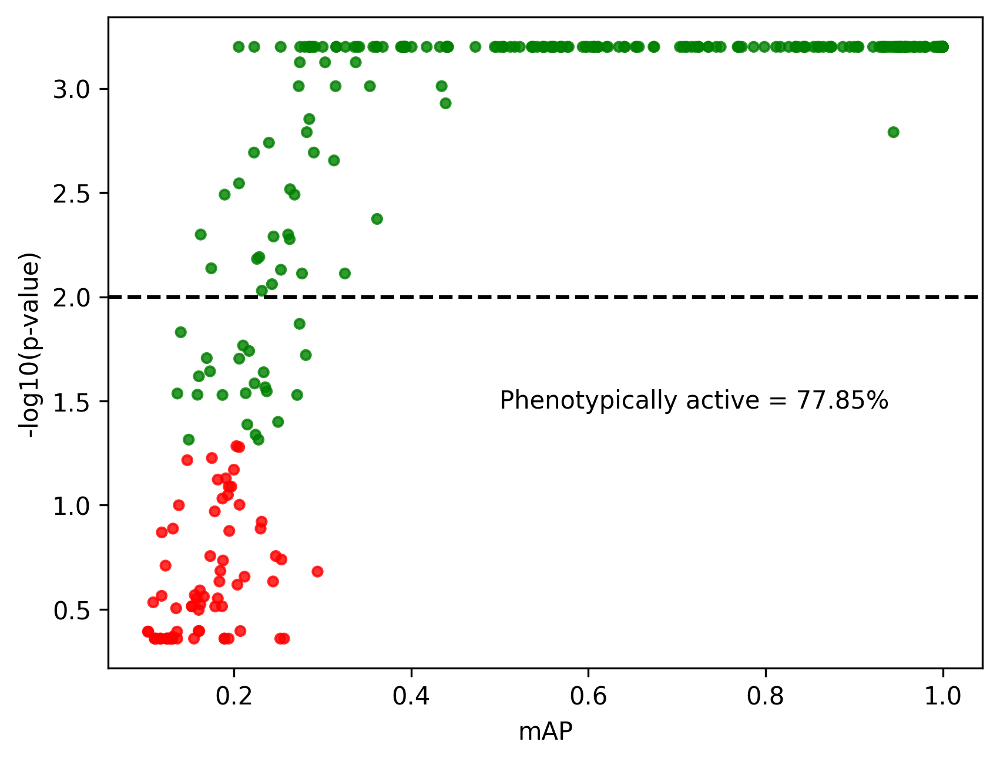

In [20]:
active_ratio = replicate_maps_DINO.below_corrected_p.mean()
colors = replicate_maps_DINO["below_corrected_p"].map({True: 'green', False: 'red'})

plt.scatter(
    data=replicate_maps_DINO,
    x="mean_average_precision",
    y="-log10(p-value)",
    c=colors,
    s=15,
    alpha=0.8,
)
# 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r',
plt.xlabel("mAP")
plt.ylabel("-log10(p-value)")
plt.axhline(-np.log10(0.01), color="black", linestyle="--")
plt.text(
    0.5, 1.5, f"Phenotypically active = {100*active_ratio:.2f}%", va="center", ha="left"
)
plt.show()


In [ ]:
grit_CP= pd.read_csv('/home/jovyan/share/data/analyses/benjamin/DINO/CELLDEATH/datasets_paper/paper_data/grit_scores/grit_CellProfiler.csv')
etest_CP = pd.read_csv("/home/jovyan/share/data/analyses/benjamin/DINO/CELLDEATH/datasets_paper/paper_data/edistance/etest_200_samples_50000_perms_CellProfiler.csv")

In [ ]:
etest_CP["significant_adj"] = (
    etest_CP["significant_adj"]                 # original string column
      .map({"True": True, "False": False})   # convert values
      .astype("boolean")       # nullable pandas BooleanDtype
)

In [ ]:
grit_DP = pd.read_csv('/home/jovyan/share/data/analyses/benjamin/DINO/CELLDEATH/datasets_paper/paper_data/grit_scores/grit_DeepProfiler.csv')
etest_DP = pd.read_csv("/home/jovyan/share/data/analyses/benjamin/DINO/CELLDEATH/datasets_paper/paper_data/edistance/etest_res_beactica_200_samples_50000_perms_DP_withmeta.csv")

In [ ]:
grit_DINO = pd.read_csv('/home/jovyan/share/data/analyses/benjamin/DINO/CELLDEATH/datasets_paper/paper_data/grit_scores/grit_DINO.csv')
etest_DINO = pd.read_csv("/home/jovyan/share/data/analyses/benjamin/DINO/CELLDEATH/datasets_paper/paper_data/edistance/etest_200_samples_50000_perms_DINO.csv")

In [ ]:
etest_DINO["significant_adj"] = (
    etest_DINO["significant_adj"]                 # original string column
      .map({"True": True, "False": False})   # convert values
      .astype("boolean")       # nullable pandas BooleanDtype
)

In [ ]:
etest_DINO['Unnamed: 0'] = etest_DINO['Unnamed: 0'].str.replace(r'_(?=[^_]*$)', '.', regex=True)

In [ ]:
cmpd_conc_filter_paper = pd.read_csv("/home/jovyan/share/data/analyses/benjamin/DINO/CELLDEATH/datasets_paper/metadata_celldeath_filter.csv")

In [ ]:
filter_list = list(cmpd_conc_filter_paper["Metadata_cmpdNameConc"])

In [ ]:
filter_200 = [i for i in filter_list if i not in groups_below_200]

In [205]:
def get_filter_stats(grit_CP, etest_CP, replicate_maps, filter_list):

    grit_CP = grit_CP[grit_CP["group"].isin(filter_list)]
    etest_CP = etest_CP[etest_CP["Unnamed: 0"].isin(filter_list)]
    replicate_maps = replicate_maps[replicate_maps["CompConc"].isin(filter_list)]  
    
    print("Unique comp. conc etest:", len(etest_CP["Unnamed: 0"].unique()))
    print("Unique comp. conc grit:", len(grit_CP["group"].unique()))
    print("Unique comp. conc mAP:", len(replicate_maps["CompConc"].unique()))

    print(
    f"Sign. groups [fraction] etest: "
    f"{len(etest_CP[etest_CP['significant_adj'] == True])} "
    f"[ {len(etest_CP[etest_CP['significant_adj'] == True]) / len(etest_CP['Unnamed: 0'].unique())} ]"
    )

    print(
        f"Sign. groups [fraction] grit: "
        f"{len(grit_CP[grit_CP['grit'] > 1.5])} "
        f"[ {len(grit_CP[grit_CP['grit'] > 1.5]) / len(grit_CP['group'].unique())} ]"
    )

    print(
        f"Sign. groups [fraction] mAP: "
        f"{len(replicate_maps[replicate_maps['below_corrected_p'] == True])} "
        f"[ {len(replicate_maps[replicate_maps['below_corrected_p'] == True]) / len(replicate_maps['CompConc'].unique())} ]"
    )
    replicate_maps_grit = pd.merge(replicate_maps,grit_CP[['group','grit']],left_on='CompConc',right_on='group',how='left')
    replicate_maps_grit = pd.merge(replicate_maps_grit,etest_CP,left_on='CompConc',right_on='Unnamed: 0',how='left')

    return replicate_maps_grit

In [210]:
replicate_maps_grit_DINO = get_filter_stats(grit_DINO, etest_DINO, replicate_maps_DINO, filter_200)

Unique comp. conc etest: 248
Unique comp. conc grit: 249
Unique comp. conc mAP: 248
Sign. groups [fraction] etest: 212 [ 0.8548387096774194 ]
Sign. groups [fraction] grit: 121 [ 0.4859437751004016 ]
Sign. groups [fraction] mAP: 195 [ 0.7862903225806451 ]


In [186]:
replicate_maps_grit_CP = get_filter_stats(grit_CP, etest_CP, replicate_maps_CP, filter_200)

Unique comp. conc etest: 253
Unique comp. conc grit: 253
Unique comp. conc mAP: 253
Sign. groups [fraction] etest: 168 [ 0.6640316205533597 ]
Sign. groups [fraction] grit: 118 [ 0.466403162055336 ]
Sign. groups [fraction] mAP: 206 [ 0.8142292490118577 ]


In [143]:
replicate_maps_grit_DP = get_filter_stats(grit_DP, etest_DP, replicate_maps_DP, filter_200)

     Unnamed: 0.1               Unnamed: 0        edist   pvalue  significant  \
0               0   BEA-0005376-AA-002_0.1    23.447902  0.00006         True   
1               1   BEA-0005376-AA-002_0.3     8.396611  0.01502         True   
2               2   BEA-0005376-AA-002_1.0    41.066791  0.00002         True   
3               3   BEA-0005376-AA-002_3.0    63.732324  0.00002         True   
4               4   BEA-0005376-AA-002_5.0   136.796749  0.00002         True   
..            ...                      ...          ...      ...          ...   
258           258  BEA-0010288-AA-001_0.99   455.861408  0.00002         True   
259           259   BEA-0010288-AA-001_3.0  1225.307829  0.00002         True   
260           260   BEA-0010288-AA-001_5.0  1373.093374  0.00002         True   
261           261  BEA-0010288-AA-001_9.99  1340.984955  0.00002         True   
262           262               [etop]_3.0  1260.636358  0.00002         True   

     pvalue_adj  significan

In [ ]:
def minmax_scale_column(df, column_name):
    """
    Scales the values in the specified column of df to the [0,1] range
    using min-max normalization.
    
    The transformation is:
        x_scaled = (x - x_min) / (x_max - x_min)
    """
    col = df[column_name]
    x_min, x_max = col.min(), col.max()
    
    # Avoid division by zero if all values are the same
    if x_min == x_max:
        df["edist_scaled"] = 0.0
    else:
        df["edist_scaled"] = (col - x_min) / (x_max - x_min)
    
    return df

In [ ]:
replicate_maps_grit = minmax_scale_column(replicate_maps_grit, "edist")


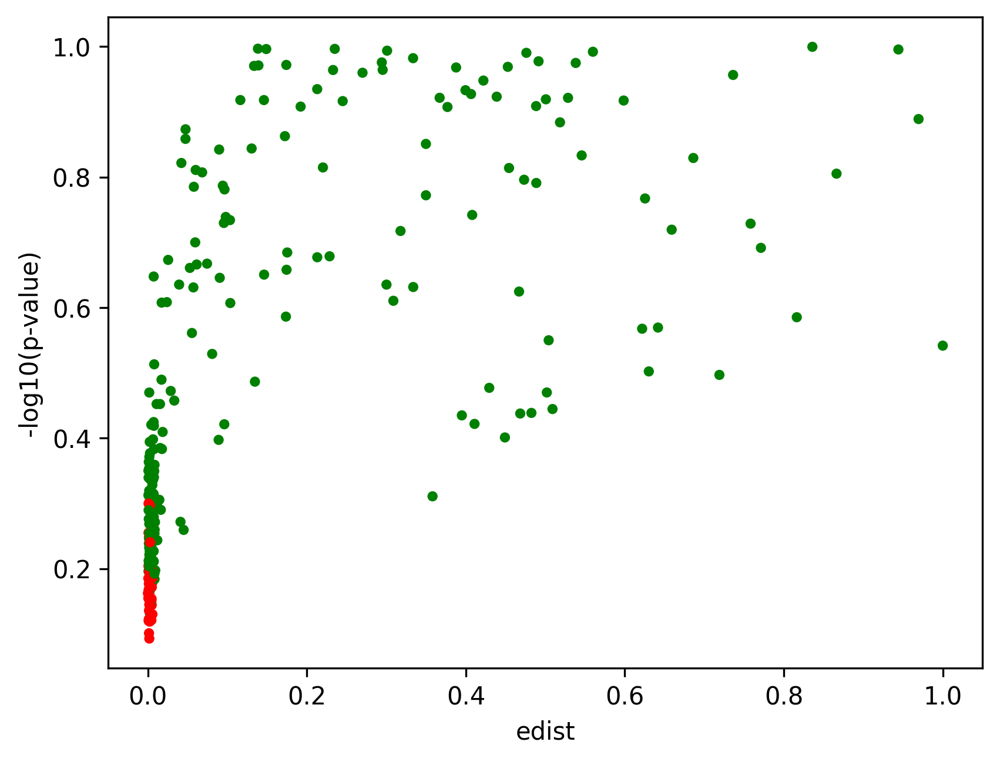

In [ ]:
import matplotlib.pyplot as plt

# Map True to green and False to red
colors = replicate_maps_grit["below_corrected_p"].map({True: 'green', False: 'red'})

# Scatter plot with custom colors
plt.scatter(
    x=replicate_maps_grit["edist_scaled"],
    y=replicate_maps_grit["mean_average_precision"],
    c=colors,
    s=10
)

# Label axes
plt.xlabel("edist")
plt.ylabel("-log10(p-value)")

# Display the plot
plt.show()

In [69]:
import matplotlib.patches as mpatches

def compare_metrics_plot(df):
    def color_significance(row):
        if row['below_corrected_p'] and row['significant_adj']:
            return 'purple'  # Significant in both
        elif row['below_corrected_p']:
            return 'red'     # Significant only in method 1
        elif row['significant_adj']:
            return 'blue'    # Significant only in method 2
        else:
            return 'gray'    # Not significant in either

    # Apply the function to assign a color to each compound
    df['color'] = df.apply(color_significance, axis=1)

    # Create the scatter plot
    plt.figure(figsize=(6,6))
    plt.scatter(df['-log10(p-value)'], df['neglog10_pvalue_adj'],
                c=df['color'], alpha=0.7, s=50)  # s=50 => marker size

    # Add optional vertical/horizontal lines (e.g., if 0 is meaningful)
    # plt.axhline(0, color='black', linewidth=0.8, linestyle='--')
    # plt.axvline(0, color='black', linewidth=0.8, linestyle='--')

    plt.xlabel('Corr. p-value mAP')
    plt.ylabel('Corr. p-value etest')
    plt.title('Comparison of Two Methods')

    # Create a custom legend
    legend_labels = {
        'purple': 'Significant in Both',
        'red':    'Significant in Method 1',
        'blue':   'Significant in Method 2',
        'gray':   'Not Significant'
    }
    handles = [mpatches.Patch(color=col, label=label)
            for col, label in legend_labels.items()]
    plt.legend(handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

    plt.tight_layout()
    plt.show()


In [141]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import pandas as pd


def compare_metrics_scatter(
    df: pd.DataFrame,
    x="-log10(p-value)",
    y="neglog10_pvalue_adj",
    *,
    col: str | None = None,
    row: str | None = None,
    figsize_per_plot: int = 4,
    alpha: float = 0.8,
    s: int = 15,
    x_label: str | None = None,
    y_label: str | None = None,
    legend_fontsize: int = 3,
    legend_ncol: int = 1,
    annotate_actives: bool = True,   # NEW
):
    """
    Faceted scatter comparing two –log10‑p metrics.

    Adds per‑subplot annotations showing the fraction of compounds that are
    significant in Method‑1 (x) and Method‑2 (y).
    """

    # ------------------------------------------------------------------
    # Colour classification
    # ------------------------------------------------------------------
    def _colour(row):
        if row["below_corrected_p"] and row["significant_adj"]:
            return "purple"
        elif row["below_corrected_p"]:
            return "red"
        elif row["significant_adj"]:
            return "blue"
        return "gray"

    df = df.copy()
    df["_colour"] = df.apply(_colour, axis=1)

    # ------------------------------------------------------------------
    # Facet bookkeeping
    # ------------------------------------------------------------------
    col_vals = sorted(df[col].unique()) if col else [None]
    row_vals = sorted(df[row].unique()) if row else [None]
    n_c, n_r = len(col_vals), len(row_vals)

    fig, axes = plt.subplots(
        n_r,
        n_c,
        figsize=(n_c * figsize_per_plot, n_r * figsize_per_plot),
        sharex=True,
        sharey=True,
        squeeze=False,
    )

    ref = -np.log10(0.05)  # reference at p=0.05

    for r, r_val in enumerate(row_vals):
        for c, c_val in enumerate(col_vals):
            ax = axes[r, c]
            sub = df.copy()
            if row:
                sub = sub[sub[row] == r_val]
            if col:
                sub = sub[sub[col] == c_val]

            ax.scatter(
                sub[x],
                sub[y],
                c=sub["_colour"],
                alpha=alpha,
                s=s,
                edgecolor="k",
                linewidths=0.3,
            )

            ax.axvline(ref, ls="--", color="lightgrey", lw=1)
            ax.axhline(ref, ls="--", color="lightgrey", lw=1)

            if col:
                ax.set_title(str(c_val))
            if row and c == 0:
                ax.set_ylabel(str(r_val))

            # ----------------------------------------------------------
            # annotate percentage actives
            # ----------------------------------------------------------
            if annotate_actives:
                pct_m1 = sub["below_corrected_p"].mean()        # Method‑1 %
                pct_m2 = sub["significant_adj"].mean()          # Method‑2 %

                # bottom‑centre for Method‑1
                ax.text(
                    0.5,
                    -0.14,
                    f"{pct_m1:.0%} active",
                    transform=ax.transAxes,
                    ha="center",
                    va="top",
                    fontsize=9,
                )

                # left‑centre for Method‑2
                ax.text(
                    -0.14,
                    0.5,
                    f"{pct_m2:.0%} active",
                    transform=ax.transAxes,
                    ha="right",
                    va="center",
                    fontsize=9,
                    rotation=90,
                )

    # ------------------------------------------------------------------
    # Shared axis labels
    # ------------------------------------------------------------------
    fig.text(0.5, 0.04, x_label or x, ha="center", va="center")
    fig.text(0.04, 0.5, y_label or y, ha="center", va="center", rotation="vertical")

    # ------------------------------------------------------------------
    # Legend on the right
    # ------------------------------------------------------------------
    legend_labels = {
        "purple": "Significant in both",
        "red":    "Method‑1 only",
        "blue":   "Method‑2 only",
        "gray":   "Not significant",
    }
    handles = [mpatches.Patch(color=c, label=l) for c, l in legend_labels.items()]

    plt.tight_layout(rect=[0.05, 0.05, 0.8, 0.95])  # leave 20 % width for legend

    fig.legend(
        handles,
        [h.get_label() for h in handles],
        loc="center left",
        bbox_to_anchor=(0.82, 0.5),
        frameon=False,
        fontsize=legend_fontsize,
        ncol=legend_ncol,
    )

    plt.show()
    return fig


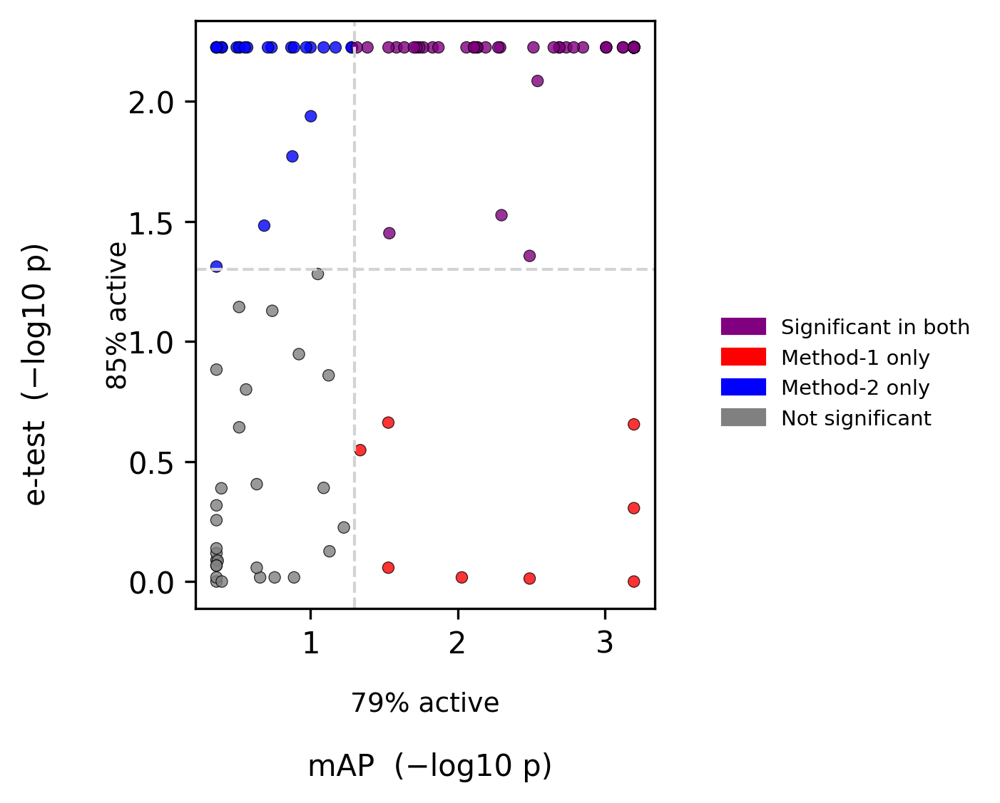

In [211]:
fig = compare_metrics_scatter(replicate_maps_grit_DINO,
    x="-log10(p-value)",
    y="neglog10_pvalue_adj",
    x_label="mAP  (−log10 p)",
    y_label="e‑test  (−log10 p)",
    legend_fontsize=7)


In [218]:
# Signficant etest
set1_map= set(replicate_maps_grit_DINO[replicate_maps_grit_DINO['below_corrected_p'] == True]['CompConc'])
set2_etest = set(replicate_maps_grit_DINO[replicate_maps_grit_DINO['significant_adj'] == True]['Unnamed: 0'])
set3_grit = set(replicate_maps_grit_DINO[replicate_maps_grit_DINO['grit'] > 1.5]['group'])


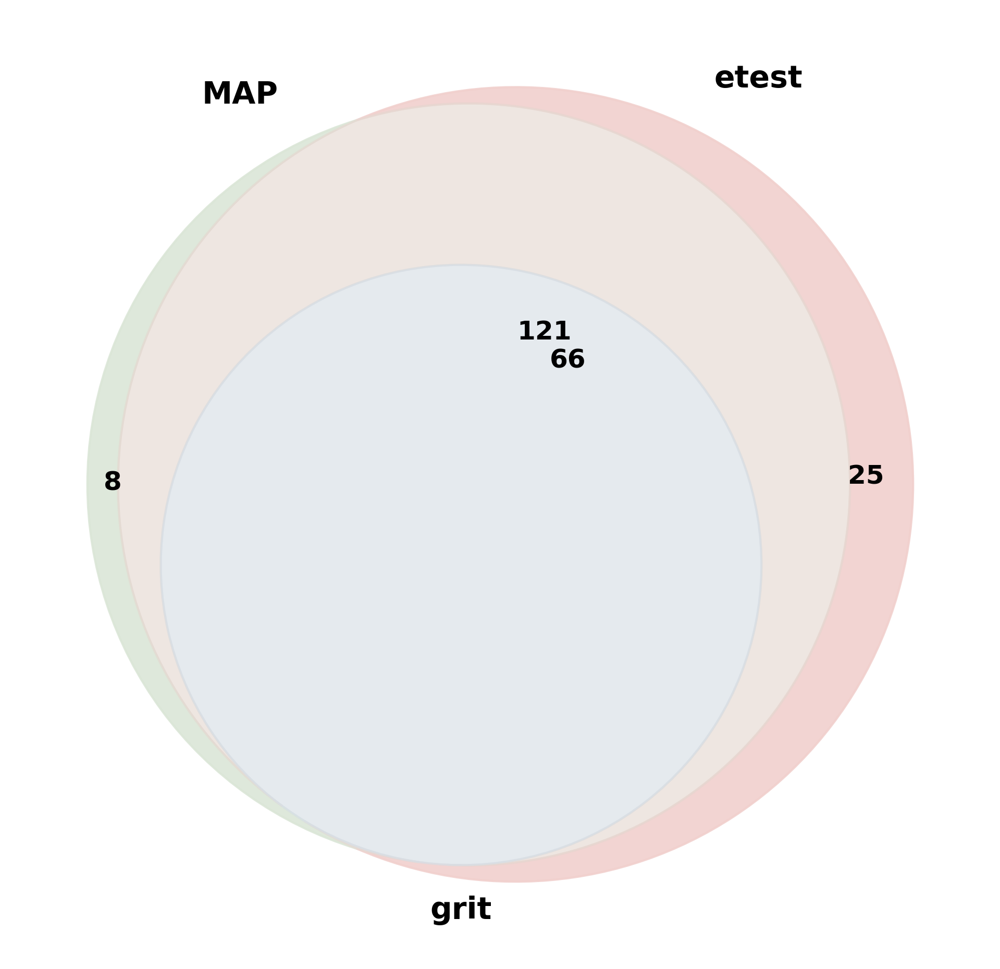

In [219]:
from matplotlib_venn import venn3


color1 = '#DBE6D7'  # Pastel green
color2 = '#F1D0CD'  # Pastel pink
color3 = '#DDE8FA'  # Pastel blue

# Create the Venn diagram with the specified colors, transparency, and line width
plt.figure(figsize=(8, 8))
venn = venn3(
    [set1_map, set2_etest, set3_grit], 
    set_labels=('MAP', 'etest', 'grit')
)
# Assign colors to individual patches
if venn.get_patch_by_id('100'):  # Only in Set 1
    venn.get_patch_by_id('100').set_color(color1)
    venn.get_patch_by_id('100').set_alpha(0.9)

if venn.get_patch_by_id('010'):  # Only in Set 2
    venn.get_patch_by_id('010').set_color(color2)
    venn.get_patch_by_id('010').set_alpha(0.9)

if venn.get_patch_by_id('001'):  # Only in Set 3
    venn.get_patch_by_id('001').set_color(color3)
    venn.get_patch_by_id('001').set_alpha(0.9)

# Assign blended colors to intersections
if venn.get_patch_by_id('110'):  # Intersection of Set 1 and Set 2
    venn.get_patch_by_id('110').set_color('#E6D9D2')  # Blended pink and green
    venn.get_patch_by_id('110').set_alpha(0.65)

if venn.get_patch_by_id('101'):  # Intersection of Set 1 and Set 3
    venn.get_patch_by_id('101').set_color('#DBE4EB')  # Blended green and blue
    venn.get_patch_by_id('101').set_alpha(0.65)

if venn.get_patch_by_id('011'):  # Intersection of Set 2 and Set 3
    venn.get_patch_by_id('011').set_color('#E7CFEA')  # Blended pink and blue
    venn.get_patch_by_id('011').set_alpha(0.65)

if venn.get_patch_by_id('111'):  # Intersection of all three sets
    venn.get_patch_by_id('111').set_color('#D7DFE6')  # Blended of all three colors
    venn.get_patch_by_id('111').set_alpha(0.65)
# Customize labels
for text in venn.set_labels:
    text.set_fontsize(14)
    text.set_fontweight('bold')

# Customize subset labels (numbers inside the diagram)
for text in venn.subset_labels:
    if text:
        text.set_fontsize(12)
        text.set_fontweight('bold')

# Show the plot
plt.show()

In [ ]:
from matplotlib_venn import venn3


color1 = '#DBE6D7'  # Pastel green
color2 = '#F1D0CD'  # Pastel pink
color3 = '#DDE8FA'  # Pastel blue

# Create the Venn diagram with the specified colors, transparency, and line width
plt.figure(figsize=(8, 8))
venn = venn3(
    [set1_etest, set2_etest, set3_etest], 
    set_labels=('DINO', 'DeepProfiler', 'CellProfiler')
)
# Assign colors to individual patches
if venn.get_patch_by_id('100'):  # Only in Set 1
    venn.get_patch_by_id('100').set_color(color1)
    venn.get_patch_by_id('100').set_alpha(0.9)

if venn.get_patch_by_id('010'):  # Only in Set 2
    venn.get_patch_by_id('010').set_color(color2)
    venn.get_patch_by_id('010').set_alpha(0.9)

if venn.get_patch_by_id('001'):  # Only in Set 3
    venn.get_patch_by_id('001').set_color(color3)
    venn.get_patch_by_id('001').set_alpha(0.9)

# Assign blended colors to intersections
if venn.get_patch_by_id('110'):  # Intersection of Set 1 and Set 2
    venn.get_patch_by_id('110').set_color('#E6D9D2')  # Blended pink and green
    venn.get_patch_by_id('110').set_alpha(0.65)

if venn.get_patch_by_id('101'):  # Intersection of Set 1 and Set 3
    venn.get_patch_by_id('101').set_color('#DBE4EB')  # Blended green and blue
    venn.get_patch_by_id('101').set_alpha(0.65)

if venn.get_patch_by_id('011'):  # Intersection of Set 2 and Set 3
    venn.get_patch_by_id('011').set_color('#E7CFEA')  # Blended pink and blue
    venn.get_patch_by_id('011').set_alpha(0.65)

if venn.get_patch_by_id('111'):  # Intersection of all three sets
    venn.get_patch_by_id('111').set_color('#D7DFE6')  # Blended of all three colors
    venn.get_patch_by_id('111').set_alpha(0.65)
# Customize labels
for text in venn.set_labels:
    text.set_fontsize(14)
    text.set_fontweight('bold')

# Customize subset labels (numbers inside the diagram)
for text in venn.subset_labels:
    if text:
        text.set_fontsize(12)
        text.set_fontweight('bold')

# Show the plot
plt.show()

## Show umap with map and DMSO

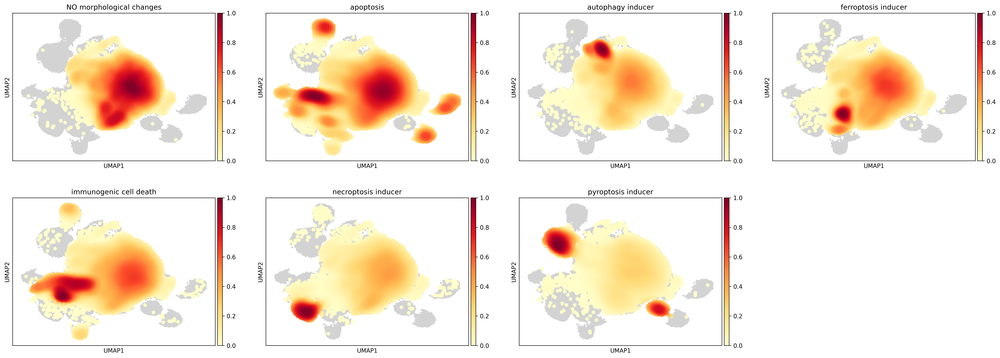

In [21]:
target_classes = [
    "NO morphological changes",
    "apoptosis",
    "autophagy inducer",
    "ferroptosis inducer",
    "immunogenic cell death",
    "necroptosis inducer",
    "pyroptosis inducer"
]

# Subset and reorder adata
adata_filtered_DINO = adata_DINO_sc[adata_DINO_sc.obs["moa"].isin(target_classes)].copy()
adata_filtered_DINO.obs["moa"] = pd.Categorical(adata_filtered_DINO.obs["moa"], categories=target_classes, ordered=True)

# Compute and plot density
sc.tl.embedding_density(adata_filtered_DINO, basis='umap', groupby='moa')
sc.pl.embedding_density(
    adata_filtered_DINO,
    basis='umap',
    key='umap_density_moa',
    bg_dotsize=40,
    fg_dotsize=150
)

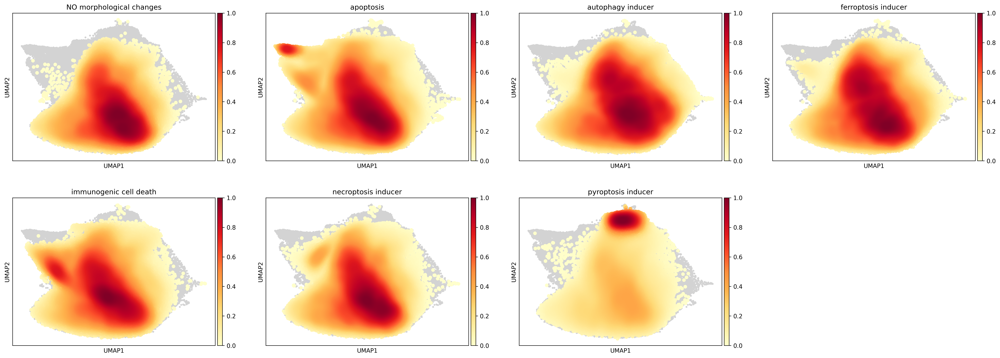

In [22]:
adata_filtered_DP = adata_DP_sc[adata_DP_sc.obs["moa"].isin(target_classes)].copy()
adata_filtered_DP.obs["moa"] = pd.Categorical(adata_filtered_DP.obs["moa"], categories=target_classes, ordered=True)

# Compute and plot density
sc.tl.embedding_density(adata_filtered_DP, basis='umap', groupby='moa')
sc.pl.embedding_density(
    adata_filtered_DP,
    basis='umap',
    key='umap_density_moa',
    bg_dotsize=40,
    fg_dotsize=150
)

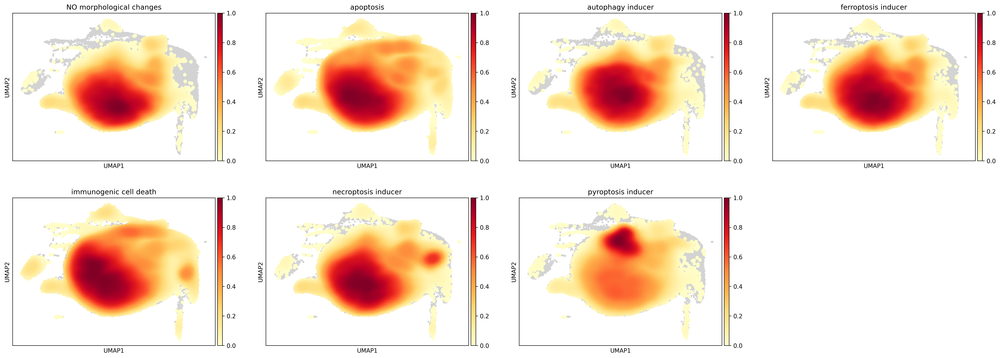

In [23]:
adata_filtered_CP = adata_CP_sc[adata_CP_sc.obs["moa"].isin(target_classes)].copy()
adata_filtered_CP.obs["moa"] = pd.Categorical(adata_filtered_CP.obs["moa"], categories=target_classes, ordered=True)

# Compute and plot density
sc.tl.embedding_density(adata_filtered_CP, basis='umap', groupby='moa')
sc.pl.embedding_density(
    adata_filtered_CP,
    basis='umap',
    key='umap_density_moa',
    bg_dotsize=40,
    fg_dotsize=150
)